# In this notebook we will clean, explore and build a model for predicting whether it will rain or not rain today and tomorrow. The data contains weather statistics from Australia in the span of 10 years. 

In [111]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import umap as up
import lightgbm as lgb

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, plot_confusion_matrix, roc_curve, roc_auc_score

import warnings
warnings.filterwarnings("ignore")

In [112]:
data = pd.read_csv("weatherAUS.csv")
data.drop("Rainfall", axis=1, inplace=True) # We will drop rainfall, because it directly tells whether or not it rains today (above 1), and we want to predict this.
data.head(2)

,Date,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No


### Check missing values.

In [113]:
def plot_missing(df):
    _, ax = plt.subplots(figsize=(8, 5))
    ax.set_title("Missing Values")
    pd.DataFrame(index=df.columns, data=(100 - (df.isnull().mean() * 100))).plot.bar(ax=ax)

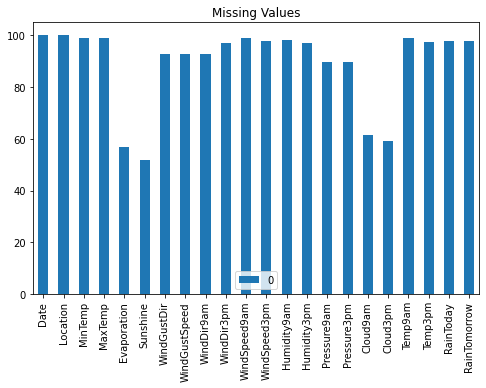

In [114]:
plot_missing(data)

In [115]:
data.isnull().mean() * 100

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

### Extract insights from the date feature.

In [116]:
data["Date"] = pd.to_datetime(data["Date"])
data["Day"] = data["Date"].dt.day
data["Month"] = data["Date"].dt.month
data["Year"] = data["Date"].dt.year
data["DayName"] = data["Date"].dt.day_name()
data["Weekend"] = data["DayName"].apply(lambda x: "Yes" if x in ["Saturday", "Sunday"] else "No")
data.drop("Date", axis=1, inplace=True)
data.head(2)

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year,DayName,Weekend
0,Albury,13.4,22.9,NaN,NaN,W,44.0,W,WNW,20.0,...,NaN,16.9,21.8,No,No,1,12,2008,Monday,No
1,Albury,7.4,25.1,NaN,NaN,WNW,44.0,NNW,WSW,4.0,...,NaN,17.2,24.3,No,No,2,12,2008,Tuesday,No


In [117]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 26 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  object 
 1   MinTemp        143975 non-null  float64
 2   MaxTemp        144199 non-null  float64
 3   Evaporation    82670 non-null   float64
 4   Sunshine       75625 non-null   float64
 5   WindGustDir    135134 non-null  object 
 6   WindGustSpeed  135197 non-null  float64
 7   WindDir9am     134894 non-null  object 
 8   WindDir3pm     141232 non-null  object 
 9   WindSpeed9am   143693 non-null  float64
 10  WindSpeed3pm   142398 non-null  float64
 11  Humidity9am    142806 non-null  float64
 12  Humidity3pm    140953 non-null  float64
 13  Pressure9am    130395 non-null  float64
 14  Pressure3pm    130432 non-null  float64
 15  Cloud9am       89572 non-null   float64
 16  Cloud3pm       86102 non-null   float64
 17  Temp9am        143693 non-nul

### Drop all samples which have a categorical feature as null.

In [118]:
for col in data:
    if data[col].dtypes == "object":
        data = data.loc[data[col].notna()]

### Encode all categorical values before imputation.

In [119]:
def encode_cat(df):
    le = LabelEncoder()
    for col in df:
        if df[col].dtypes == "object":
            df[col] = le.fit_transform(df[col]).astype(int)

In [120]:
encode_cat(data)
data.head(2)

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year,DayName,Weekend
0,1,13.4,22.9,NaN,NaN,13,44.0,13,14,20.0,...,NaN,16.9,21.8,0,0,1,12,2008,1,0
1,1,7.4,25.1,NaN,NaN,14,44.0,6,15,4.0,...,NaN,17.2,24.3,0,0,2,12,2008,5,0


### There is quite a bit of missing values on some columns. Impute using prediction (IterativeImputer).

In [121]:
ii = IterativeImputer(max_iter=20)
# ii = IterativeImputer(estimator=RandomForestRegressor(n_estimators=5, n_jobs=-1))
data = pd.DataFrame(columns=data.columns, data=ii.fit_transform(data))
data.head(2)

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year,DayName,Weekend
0,1.0,13.4,22.9,6.267402,7.548409,13.0,44.0,13.0,14.0,20.0,...,5.066890,16.9,21.8,0.0,0.0,1.0,12.0,2008.0,1.0,0.0
1,1.0,7.4,25.1,5.633099,11.111700,14.0,44.0,6.0,15.0,4.0,...,2.809496,17.2,24.3,0.0,0.0,2.0,12.0,2008.0,5.0,0.0


### Feature Engineering.

In [122]:
def has_digit(s):
    for c in s:
        if c.isdigit():
            return c
    return None

### Convert all "double" features (e.g features which have two feature columns of the same feature of each day, such as WindDir for both 9am and 3pm) to average each day. This will simplify our model and make it more accurate and faster.

In [123]:
data["AvgTemp"] = (data["MinTemp"] + data["MaxTemp"]) / 2
l = data.shape[1]
idx = 0
col_drop_list = ["MinTemp", "MaxTemp"]
while idx < l:
    col_name = data.columns[idx]
    digit = has_digit(col_name)
    if digit != None and idx + 1 < l:
        data[("Avg" + col_name.split(digit)[0])] = (data.iloc[:,idx] + data.iloc[:,idx + 1]) / 2
        col_drop_list.append(data.columns[idx])
        col_drop_list.append(data.columns[idx + 1])
        idx += 1
    idx += 1
data.drop(labels=col_drop_list, axis=1, inplace=True) 

### Clean column names by making them more "Python friendly".

In [124]:
def clean_col(name):
    return name.strip().lower().replace(" ", "_")

In [125]:
data.rename(columns=clean_col, inplace=True)

### Explore the data a bit more. As our data is multivariate, we focus more on the big picture.

In [126]:
data.shape

(123710, 18)

In [127]:
data.describe().round(2)

,location,evaporation,sunshine,windgustdir,windgustspeed,raintoday,raintomorrow,day,month,year,dayname,weekend,avgtemp,avgwinddir,avgwindspeed,avghumidity,avgpressure,avgcloud
count,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00,123710.00
mean,22.76,5.27,7.53,7.73,40.69,0.22,0.22,15.71,6.43,2012.81,3.01,0.28,19.60,7.52,17.09,59.26,1016.30,4.42
std,13.62,3.79,3.51,4.66,13.39,0.42,0.42,8.79,3.48,2.53,2.00,0.45,6.56,3.72,7.32,18.39,6.72,2.26
min,0.00,-5.39,-2.44,0.00,7.00,0.00,0.00,1.00,1.00,2007.00,0.00,0.00,-6.30,0.00,2.00,-77.24,979.75,-2.09
25%,11.00,2.80,5.07,3.00,31.00,0.00,0.00,8.00,3.00,2011.00,1.00,0.00,14.75,4.50,12.00,47.50,1011.90,2.60
50%,23.00,4.80,7.95,8.00,39.00,0.00,0.00,16.00,6.00,2013.00,3.00,0.00,19.25,7.50,16.00,60.50,1016.35,4.50
75%,34.00,7.02,10.30,12.00,48.00,0.00,0.00,23.00,9.00,2015.00,5.00,1.00,24.25,10.00,21.50,72.10,1020.60,6.50
max,46.00,86.20,19.70,15.00,135.00,1.00,1.00,31.00,12.00,2017.00,6.00,1.00,41.60,15.00,80.50,109.00,1040.05,9.98


### Pairplot using both y values as hues. Limit plot to a small fraction of our data as we have too many samples.

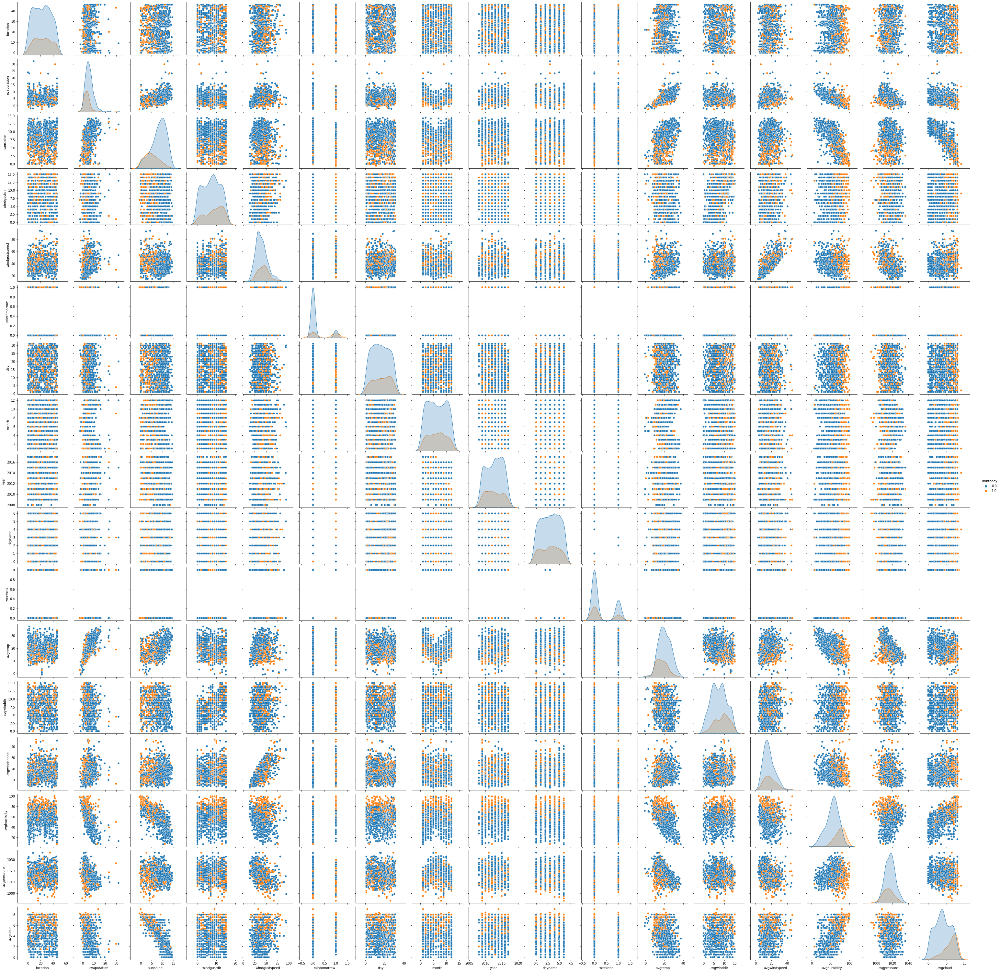

In [128]:
sns.pairplot(data.sample(1000), hue="raintoday", diag_kind="kde")
plt.savefig("Pairplot_RainToday.png", transparent=False)

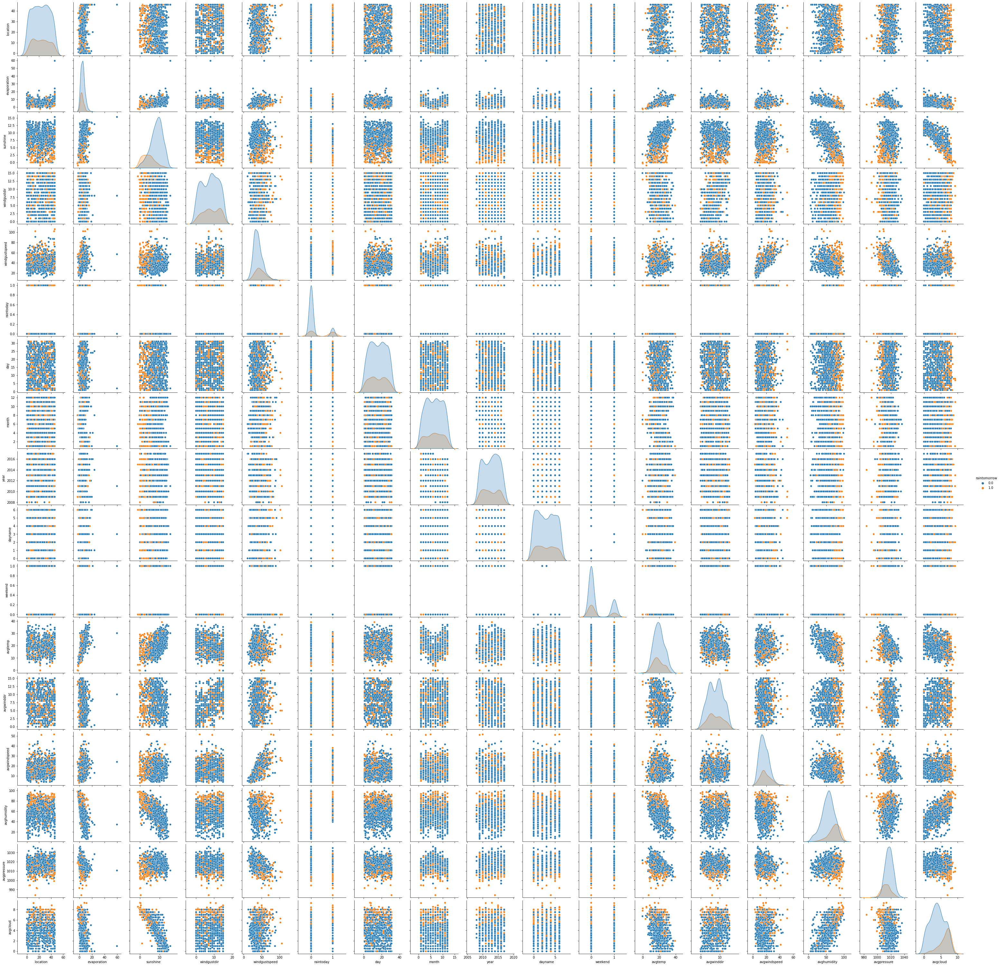

In [129]:
sns.pairplot(data.sample(1000), hue="raintomorrow", diag_kind="kde")
plt.savefig("Pairplot_RainTomorrow.png", transparent=False)

### Plot a correlation matrix.

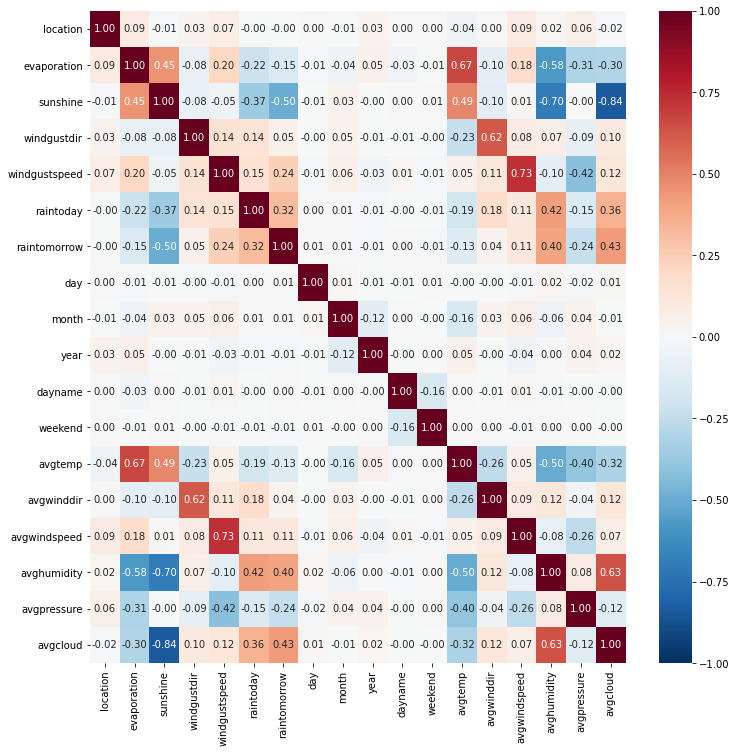

In [130]:
fig, ax = plt.subplots(figsize=(12, 12))
ax = sns.heatmap(
    data.corr(),
    fmt=".2f",
    annot=True,
    ax=ax,
    cmap="RdBu_r",
    vmin=-1,
    vmax=1,
)

### There are no correlations high or low enough to justify removing.

### Check for outliers using the LocalOutlierFactor algorithm. Values higher than 1 are possible outliers.

In [131]:
lof = LocalOutlierFactor()
print(f"Number of possible outliers (K value over 1): {sum(np.where(lof.fit_predict(data) > 1))}")

Number of possible outliers (K value over 1): []


### There doesn't seem to be any outliers.

### Check for class imbalance.

<AxesSubplot:title={'center':'RainTomorrow class balance'}>

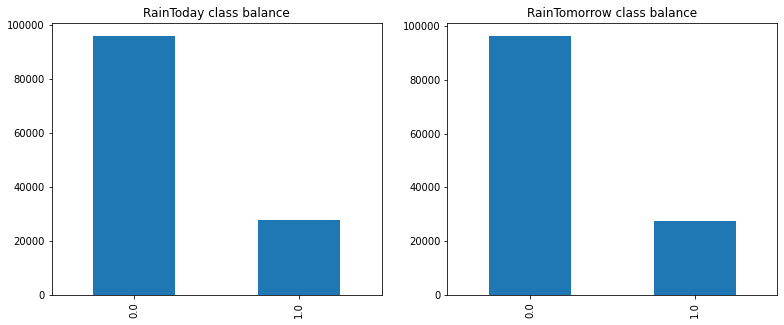

In [132]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
axes[0].set_title("RainToday class balance")
data.raintoday.value_counts().plot.bar(ax=axes[0])
axes[1].set_title("RainTomorrow class balance")
data.raintomorrow.value_counts().plot.bar(ax=axes[1])

### There is a moderate class imbalance. We will take this into account when creating our model.

### Separate target labels from data.

In [133]:
y_today = data.pop("raintoday")
y_tomorrow = data.pop("raintomorrow")

### Standardize data.

In [134]:
ss = StandardScaler()
data = pd.DataFrame(columns=data.columns, data=ss.fit_transform(data))
data.head(2)

,location,evaporation,sunshine,windgustdir,windgustspeed,day,month,year,dayname,weekend,avgtemp,avgwinddir,avgwindspeed,avghumidity,avgpressure,avgcloud
0,-1.597748,0.263809,0.004225,1.130298,0.247578,-1.673682,1.602307,-1.900804,-1.005170,-0.627126,-0.037752,1.605499,0.670350,-0.694205,-1.324252,0.936248
1,-1.597748,0.096432,1.020473,1.344664,0.247578,-1.559902,1.602307,-1.900804,0.992814,-0.627126,0.175549,0.799873,-0.559182,-1.346811,-1.056314,-0.863276


### Reduce dimensions to 2 for visualization using the UMAP algorithm.

In [135]:
umap = up.UMAP(n_components=2, n_neighbors=20, min_dist=0.15)
data_umap = umap.fit_transform(data)

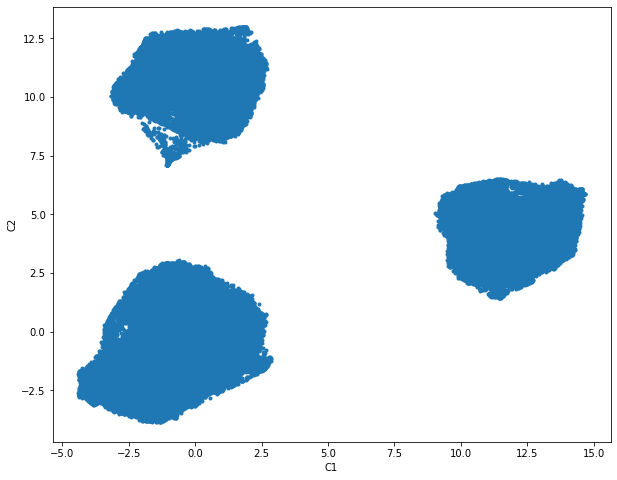

In [136]:
fig, ax = plt.subplots(figsize=(10, 8))
plt.scatter(x=data_umap[:,0], y=data_umap[:,1], marker=".")
ax.set_xlabel("C1")
_ = ax.set_ylabel("C2")

### There seems to be some obvious clusters when data is reduced to two dimensions.

### Lets start model building. We will use the Gradient Boosting algorithm LightGBM.

### First, split the data into training and testing set.

In [137]:
X_train_td, X_test_td, y_train_td, y_test_td = train_test_split(data, y_today, test_size=0.3) # Set for raintoday
X_train_tm, X_test_tm, y_train_tm, y_test_tm = train_test_split(data, y_tomorrow, test_size=0.3) # Set for raintomorrow

### Start with parameter tuning.

In [138]:
params = {
    # Fixed params
    "objective" : ["binary"],
    "metric" : ["auc"],
    "max_depth" : [-1],
    "num_iterations" : [100],

    # Tuning params
    "learning_rate" : [0.01, 0.02, 0.03, 0.04],
    "num_leaves" : [2047, 4095, 8191, 16383],
    "is_unbalance" : [True, False]
}

gs_cv = GridSearchCV(estimator=lgb.LGBMClassifier(), param_grid=params, scoring="roc_auc", n_jobs=-1)
gs_cv.fit(data, y_tomorrow)

GridSearchCV(estimator=LGBMClassifier(is_unbalance=[True, False],
                                      learning_rate=[0.01, 0.02, 0.03, 0.04],
                                      max_depth=[-1], metric=['auc'],
                                      num_iterations=[100],
                                      num_leaves=[2047, 4095, 8191, 16383],
                                      objective=['binary']),
             n_jobs=-1,
             param_grid={'is_unbalance': [True, False],
                         'learning_rate': [0.01, 0.02, 0.03, 0.04],
                         'max_depth': [-1], 'metric': ['auc'],
                         'num_iterations': [100],
                         'num_leaves': [2047, 4095, 8191, 16383],
                         'objective': ['binary']},
             scoring='roc_auc')

In [139]:
print(f"""Best Params:
{gs_cv.best_params_}
Best Score:
{gs_cv.best_score_}""")

Best Params:
{'is_unbalance': True, 'learning_rate': 0.03, 'max_depth': -1, 'metric': 'auc', 'num_iterations': 100, 'num_leaves': 4095, 'objective': 'binary'}
Best Score:
0.8900630623406702


### Train final models for both rain today & rain tomorrow.

In [140]:
clf_today = lgb.LGBMClassifier(**gs_cv.best_params_)
clf_today.fit(X_train_td, y_train_td)

clf_tomorrow = lgb.LGBMClassifier(**gs_cv.best_params_)
clf_tomorrow.fit(X_train_tm, y_train_tm)

LGBMClassifier(is_unbalance=True, learning_rate=0.03, metric='auc',
               num_iterations=100, num_leaves=4095, objective='binary')

### Evaluate model performance using various metrics.

In [141]:
y_pred_td = clf_today.predict(X_test_td)
y_pred_tm = clf_tomorrow.predict(X_test_tm)
print(f"""Classification Accuracy (percentage of correct predictions)
RainToday: {accuracy_score(y_pred_td, y_test_td)}
RainTomorrow: {accuracy_score(y_pred_tm, y_test_tm)}""")

Classification Accuracy (percentage of correct predictions)
RainToday: 0.8311373373211544
RainTomorrow: 0.8755961522916498


In [142]:
print(f"""Null Accuracy (accuracy that could be achieved by always predicting the most frequent class)
RainToday: {max(y_test_td.mean(), 1 - y_test_td.mean())}
RainTomorrow: {max(y_test_tm.mean(), 1 - y_test_tm.mean())}""")

Null Accuracy (accuracy that could be achieved by always predicting the most frequent class)
RainToday: 0.7757659041306281
RainTomorrow: 0.7785681567105867


### Plot confusion matrix. Confusion matrix basically tells us what types of errors our classifiers are making. (False Positive, False Negative, etc)

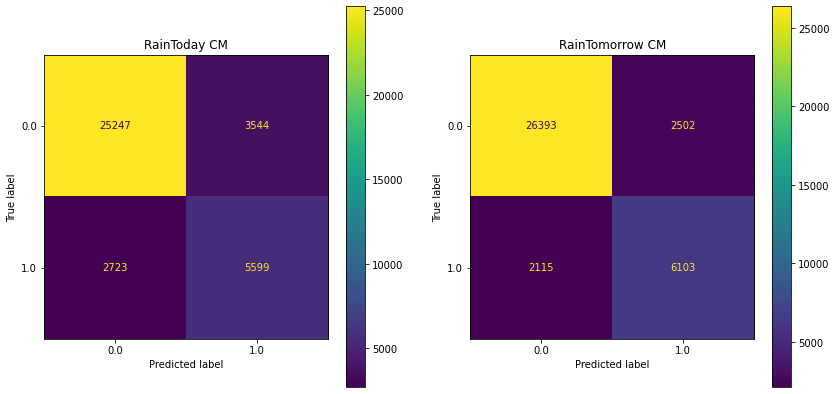

In [143]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].set_title("RainToday CM")
plot_confusion_matrix(clf_today, X_test_td, y_test_td, ax=axes[0])
axes[1].set_title("RainTomorrow CM")
plot_confusion_matrix(clf_tomorrow, X_test_tm, y_test_tm, ax=axes[1])

### Looks like the errors are fairly balanced between True Negative and False Negative.

### Plot prediction probability distribution on a histogram.

Text(0, 0.5, 'Frequency')

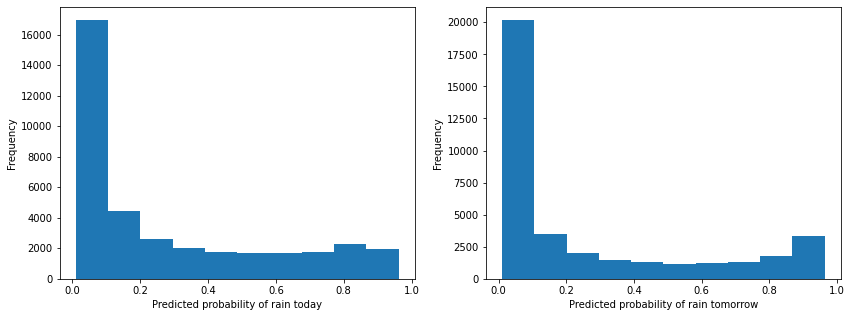

In [144]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].hist(clf_today.predict_proba(X_test_td)[:,1])
axes[0].set_xlabel("Predicted probability of rain today")
axes[0].set_ylabel("Frequency")
axes[1].hist(clf_tomorrow.predict_proba(X_test_tm)[:,1])
axes[1].set_xlabel("Predicted probability of rain tomorrow")
axes[1].set_ylabel("Frequency")

### Plot a ROC curve.

Text(0, 0.5, 'True Positive Rate')

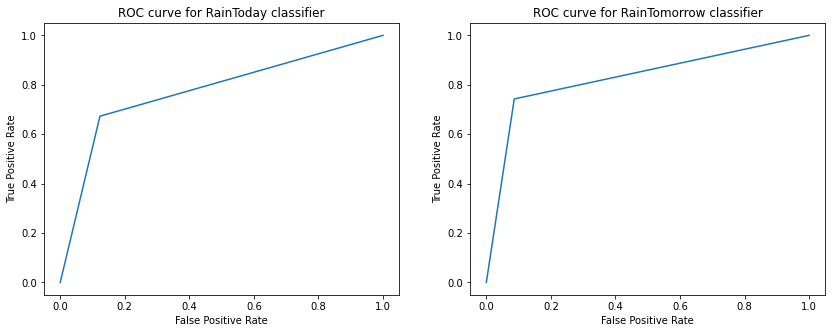

In [145]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fpr, tpr, thres = roc_curve(y_test_td, y_pred_td)
axes[0].plot(fpr, tpr)
axes[0].set_title("ROC curve for RainToday classifier")
axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
fpr, tpr, thres = roc_curve(y_test_tm, y_pred_tm)
axes[1].plot(fpr, tpr)
axes[1].set_title("ROC curve for RainTomorrow classifier")
axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")

In [146]:
print(f"""AUC score (the percentage of the ROC plot that is underneath the curve, higher number equals better classifier performance)
RainToday: {roc_auc_score(y_pred_td, y_test_td)}
RainTomorrow: {roc_auc_score(y_pred_tm, y_test_tm)}""")

AUC score (the percentage of the ROC plot that is underneath the curve, higher number equals better classifier performance)
RainToday: 0.757513374179324
RainTomorrow: 0.8175245567530632


In [147]:
print(f"""Cross-validation AUC score (the percentage of the ROC plot that is underneath the curve, higher number equals better classifier performance)
RainToday: {cross_val_score(clf_today, data, y_today, scoring="roc_auc").mean()}
RainTomorrow: {cross_val_score(clf_tomorrow, data, y_tomorrow, scoring="roc_auc").mean()}""")

Cross-validation AUC score (the percentage of the ROC plot that is underneath the curve, higher number equals better classifier performance)
RainToday: 0.832853811808835
RainTomorrow: 0.8900630623406702


### Finally, lets plot the feature importance of the LightGBM tree models. This helps us learn more about how our model made the decisions, and which features were most important or least important in determining the result.

<AxesSubplot:title={'center':'Feature importance of RainTomorrow classifier'}, xlabel='Feature importance', ylabel='Features'>

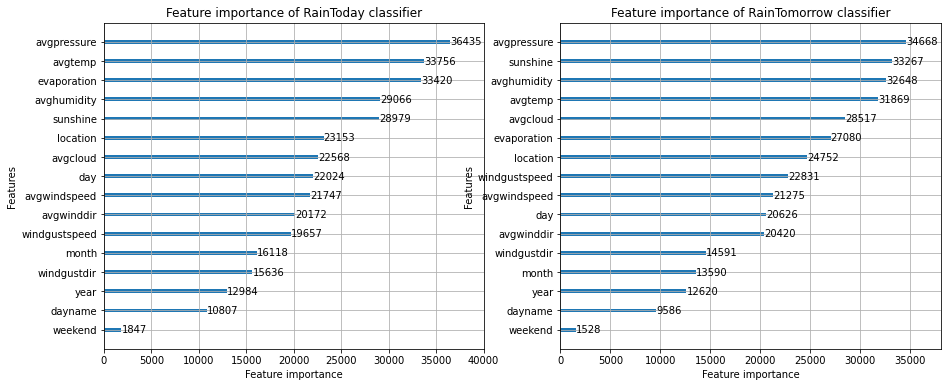

In [148]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
lgb.plot_importance(clf_today, ax=axes[0], title="Feature importance of RainToday classifier")
lgb.plot_importance(clf_tomorrow, ax=axes[1], title="Feature importance of RainTomorrow classifier")

### Quick observations: Average air pressure is the most important feature in predicting rain both today and tomorrow, and it appears whether it is weekend or not does not matter to rain.

### Interestingly, our classifier is better at predicting rain tomorrow rather than today. Probably because the data (features) are more geared towards predicting tomorrow. Also, hyperparameter tuning was done with labels from tomorrow.